In [2]:
import numpy as np
import matplotlib.pyplot as plt
import math
from matplotlib.lines import Line2D
from scipy.stats import beta as beta_dist
import pandas as pd
from tabulate import tabulate
import warnings
import seaborn as sns
import os.path as osp

In [3]:
from IPython.display import set_matplotlib_formats
set_matplotlib_formats('pdf', 'svg')
from matplotlib import rcParams
rcParams['font.family'] = 'serif'
import matplotlib
matplotlib.style.use('classic')

/tmp/ipykernel_3487595/1290025429.py:2: DeprecationWarning: `set_matplotlib_formats` is deprecated since IPython 7.23, directly use `matplotlib_inline.backend_inline.set_matplotlib_formats()`
  set_matplotlib_formats('pdf', 'svg')


In [5]:
%load_ext autoreload
%autoreload 2
from rankingFairness.src.experiment import simpleOffline, BayesianSetup, UCB_BayesianSetup,Thompson_BayesianSetup
from rankingFairness.src.utils import set_seed, plotDrichletDist, plotBetaDist
from rankingFairness.src.rankings import PRP_Ranker, EO_RankerII, TS_RankerII, DP_Ranker, Uniform_Ranker, DP_RankerII, EO_Ranker
from rankingFairness.src.distributions import Bernoulli, BetaBernoulli, Multinomial, DrichletMultinomial, Drichlet

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [6]:
SEED=42
set_seed(SEED)
rel_diff=1
save_path='/share/thorsten/rr568/CostOptimal_FairRankings/plots'

In [7]:
def plot_relevance_probs(probs_a, probs_b, loc='lower right', extra=False, savefig=None):
    fig, ax =plt.subplots(figsize=(5,5))
    if extra:
        ax.scatter(np.arange(1,len(probs_a)+1), probs_a, s=80, c='teal', alpha=0.8, label='Majority Group')
        ax.scatter(np.arange(1, len(probs_b)+1), probs_b, s=80, c='lightpink', alpha=0.8, label='Minority Group')
    else:
        ax.scatter(np.arange(1,len(probs_a)+1), probs_a, s=80, c='teal',alpha=0.8)
        ax.scatter(np.arange(1, len(probs_b)+1), probs_b, s=80, c='lightpink', alpha=0.8)
    relevance_handle = ax.plot([], [], ' ', label=r'$\bf{n_A=}$'+f"{sum(probs_a):.2f},"+ r'$\bf{n_B=}$'+f"{sum(probs_b):.2f}")
    size_handle = ax.plot([], [], ' ', label=r'$\bf{\vert A \vert=}$' + f"{len(probs_a)}," +r'$\bf{\vert B \vert=}$'+ f"{len(probs_b)}")
    handles, labels = ax.get_legend_handles_labels()
    plt.legend(handles=handles, fontsize=15)

    ax.set_xlabel('Candidates', fontsize=15)
    ax.set_xticks([])
    ax.set_ylabel(r'$\mathbb{P}(r_i|\mathcal{D})$', fontsize=20)
    ax.tick_params(axis='y', labelsize=10)
    ax.tick_params(axis='x', labelsize=10)
    ax.legend( loc=loc,markerscale=1., scatterpoints=1, fontsize=15, fancybox=True, framealpha=0.5)
    plt.grid()
    plt.tight_layout()
    if savefig is not None:
        plt.savefig(f"{osp.join('/share/thorsten/rr568/CostOptimal_FairRankings/plots/relevances',str(savefig))}")
    plt.show()
    plt.close()

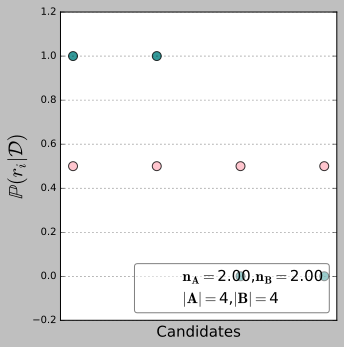

In [7]:
A_true=[1,1,0,0]
B_true=[0.5]*4
plot_relevance_probs(A_true, B_true)

100%|█████████████████████████████████████████████████████████| 1000/1000 [00:00<00:00, 107361.81it/s]


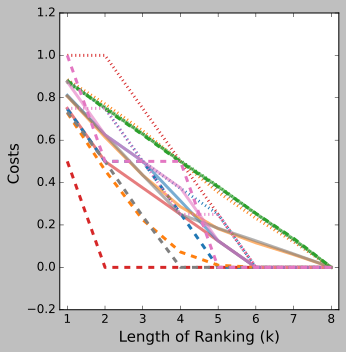

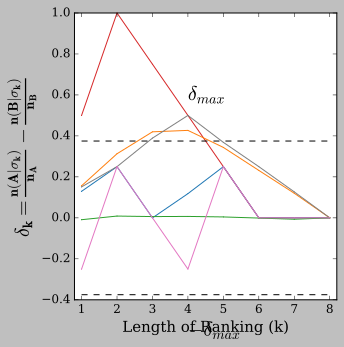

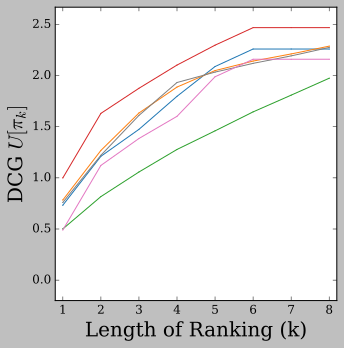

In [8]:
A_true=[0,1,0,1]
B_true=[0.5]*4
A_dist = [Bernoulli(p) for p in A_true]
B_dist = [Bernoulli(p) for p in B_true]
exp = simpleOffline(num_groups=2, start_minority_idx=len(A_true), num_docs=len(A_true)+len(B_true), 
                    predfined_ls=[A_dist, B_dist], distType=BetaBernoulli, switch_start=True)
exp.experiment(rankingAlgos=[PRP_Ranker, EO_RankerII, TS_RankerII, DP_Ranker, Uniform_Ranker, DP_RankerII], simulations=1000)

In [22]:
exp.cost_majority

array([[0.5   , 0.    , 0.    , 0.    , 0.    , 0.    , 0.    , 0.    ],
       [0.7545, 0.5   , 0.5   , 0.2465, 0.    , 0.    , 0.    , 0.    ],
       [0.722 , 0.4555, 0.2255, 0.0645, 0.0115, 0.    , 0.    , 0.    ],
       [0.7405, 0.5   , 0.263 , 0.    , 0.    , 0.    , 0.    , 0.    ],
       [0.876 , 0.753 , 0.64  , 0.508 , 0.365 , 0.247 , 0.1255, 0.    ]])

In [23]:
exp.cost_minority

array([[1.     , 1.     , 0.75   , 0.5    , 0.25   , 0.     , 0.     ,
        0.     ],
       [0.87275, 0.75   , 0.5    , 0.37675, 0.25   , 0.     , 0.     ,
        0.     ],
       [0.889  , 0.77225, 0.6425 , 0.50025, 0.36275, 0.22775, 0.10925,
        0.     ],
       [0.87975, 0.75   , 0.6185 , 0.5    , 0.37675, 0.25   , 0.134  ,
        0.     ],
       [0.872  , 0.75625, 0.63125, 0.5035 , 0.3835 , 0.2535 , 0.13025,
        0.     ]])

In [24]:
exp.total_cost

array([[0.75    , 0.5     , 0.375   , 0.25    , 0.125   , 0.      ,
        0.      , 0.      ],
       [0.813625, 0.625   , 0.5     , 0.311625, 0.125   , 0.      ,
        0.      , 0.      ],
       [0.8055  , 0.613875, 0.434   , 0.282375, 0.187125, 0.113875,
        0.054625, 0.      ],
       [0.810125, 0.625   , 0.44075 , 0.25    , 0.188375, 0.125   ,
        0.067   , 0.      ],
       [0.874   , 0.754625, 0.635625, 0.50575 , 0.37425 , 0.25025 ,
        0.127875, 0.      ]])

In [49]:
exp.ranking

array([[[0, 1, 4, ..., 7, 2, 3],
        [0, 1, 4, ..., 7, 2, 3],
        [0, 1, 4, ..., 7, 2, 3],
        ...,
        [0, 1, 4, ..., 7, 2, 3],
        [0, 1, 4, ..., 7, 2, 3],
        [0, 1, 4, ..., 7, 2, 3]],

       [[4, 0, 5, ..., 7, 2, 3],
        [0, 4, 5, ..., 7, 2, 3],
        [0, 4, 5, ..., 7, 2, 3],
        ...,
        [4, 0, 5, ..., 7, 2, 3],
        [4, 0, 5, ..., 7, 2, 3],
        [4, 0, 5, ..., 7, 2, 3]],

       [[5, 1, 0, ..., 6, 2, 3],
        [4, 1, 7, ..., 6, 2, 3],
        [1, 4, 0, ..., 5, 3, 7],
        ...,
        [7, 1, 0, ..., 4, 5, 6],
        [1, 6, 0, ..., 5, 7, 2],
        [0, 7, 1, ..., 2, 3, 5]],

       [[4, 0, 5, ..., 6, 3, 7],
        [0, 4, 5, ..., 2, 3, 7],
        [0, 4, 1, ..., 2, 3, 7],
        ...,
        [0, 4, 1, ..., 2, 3, 7],
        [0, 4, 1, ..., 2, 3, 7],
        [4, 0, 1, ..., 2, 3, 7]],

       [[6, 3, 0, ..., 2, 4, 7],
        [6, 5, 3, ..., 1, 0, 2],
        [2, 6, 3, ..., 4, 1, 5],
        ...,
        [2, 3, 1, ..., 6, 5, 0],
   

100%|██████████████████████████████████████████████████████████| 1000/1000 [00:00<00:00, 66401.29it/s]


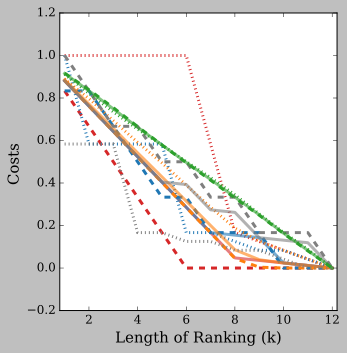

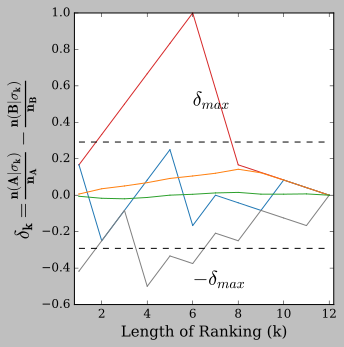

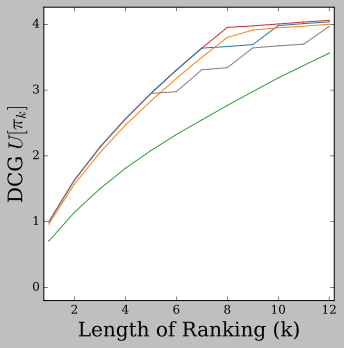

In [10]:
A_true=[1]*6
B_true=[1,1,0.1,0.1,0.1,0.1]
A_dist = [Bernoulli(p) for p in A_true]
B_dist = [Bernoulli(p) for p in B_true]
exp = simpleOffline(num_groups=2, start_minority_idx=len(A_true), num_docs=len(A_true)+len(B_true), 
                    predfined_ls=[A_dist, B_dist], distType=BetaBernoulli, switch_start=False)
exp.experiment(rankingAlgos=[PRP_Ranker, EO_RankerII, TS_RankerII, DP_Ranker, Uniform_Ranker], simulations=1000)

100%|████████████████████████████████████████████| 1000/1000 [00:00<00:00, 94213.80it/s]


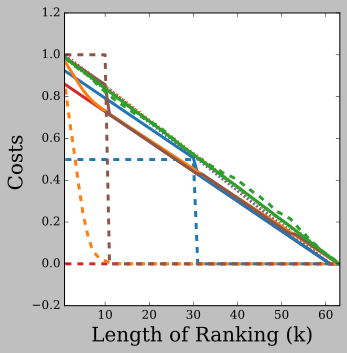

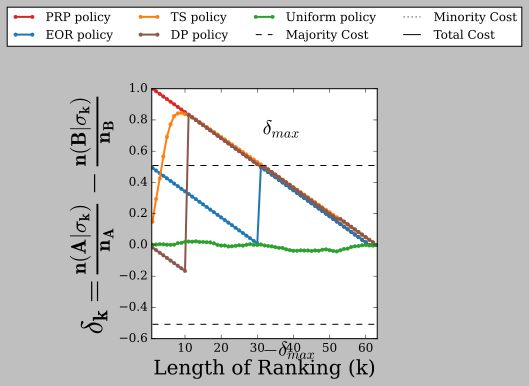

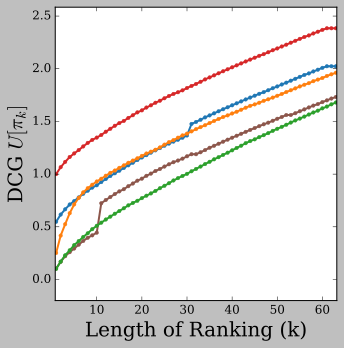

In [38]:
A_true=[1,0,0]
B_true=[0.1]*60
A_dist = [Bernoulli(p) for p in A_true]
B_dist = [Bernoulli(p) for p in B_true]
exp = simpleOffline(num_groups=2, start_minority_idx=len(A_true), num_docs=len(A_true)+len(B_true), 
                    predfined_ls=[A_dist, B_dist], distType=BetaBernoulli, switch_start=True)
exp.experiment(rankingAlgos=[PRP_Ranker, EO_RankerII, TS_RankerII, DP_Ranker, Uniform_Ranker], simulations=1000)

100%|████████████████████████████████████████████| 1000/1000 [00:00<00:00, 86357.64it/s]


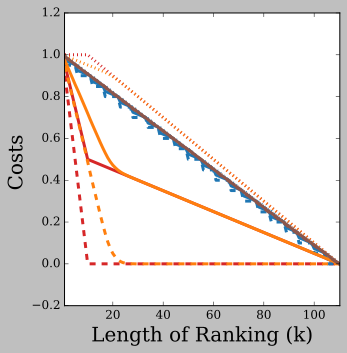

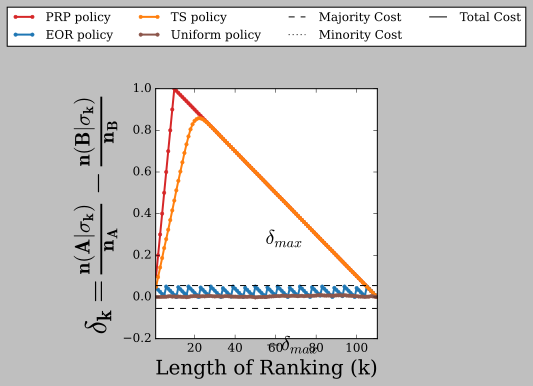

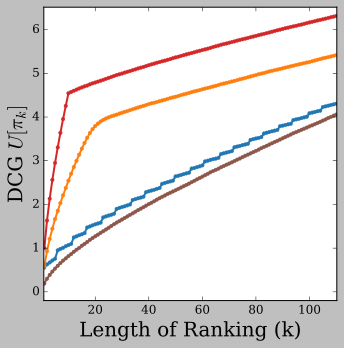

In [37]:
A_true=[1]*10
B_true=[0.1]*100
A_dist = [Bernoulli(p) for p in A_true]
B_dist = [Bernoulli(p) for p in B_true]
exp = simpleOffline(num_groups=2, start_minority_idx=len(A_true), num_docs=len(A_true)+len(B_true), 
                    predfined_ls=[A_dist, B_dist], distType=BetaBernoulli, switch_start=True)
exp.experiment(rankingAlgos=[PRP_Ranker, EO_RankerII, TS_RankerII, Uniform_Ranker], simulations=1000)

In [29]:
# exp.total_cost[1]

In [30]:
# exp.total_cost[3]

In [31]:
# exp.ranking[1,...][1:3]

In [32]:
# exp.ranking[3,...]

In [9]:
A_true = [1, 0.6, 0.5, 0.5, 0.4, 0.1, 0.1, 0.1,0.1,0.1, 0.1,0.1,0.1,0.1,0.1]
B_true = [1,0.5,0.5,0.5,]+[0.05]*30
np.random.shuffle(A_true)
np.random.shuffle(B_true)
# A_true=[1,0.7,0.55,0.5,0.5,0.5,0.5,0.5]
# B_true=[1,0.5,0.1,0.1]
A_dist = [Bernoulli(p) for p in A_true]
B_dist = [Bernoulli(p) for p in B_true]
exp = simpleOffline(num_groups=2, start_minority_idx=len(A_true), num_docs=len(A_true)+len(B_true), 
    predfined_ls=[A_dist, B_dist], distType=BetaBernoulli,
                    offset=0.07, switch_start=False)
exp.experiment(rankingAlgos=[PRP_Ranker, EO_RankerII, TS_RankerII, DP_Ranker, Uniform_Ranker], simulations=1000)
plot_relevance_probs(A_true, B_true, loc='upper right', extra=True)

100%|██████████████████████████████████████████████████████████| 1000/1000 [00:00<00:00, 69672.82it/s]


KeyboardInterrupt: 

100%|██████████████████████████████████████████████████████████| 1000/1000 [00:00<00:00, 68866.33it/s]


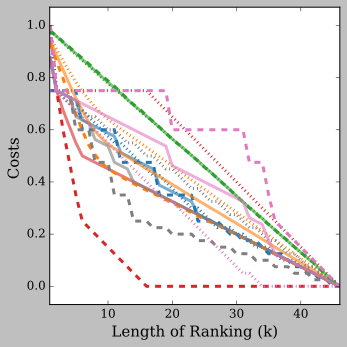

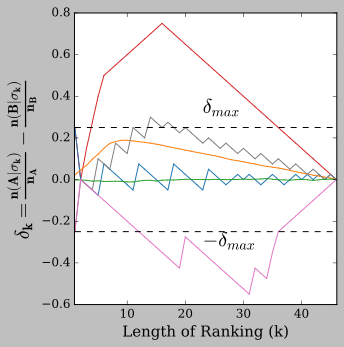

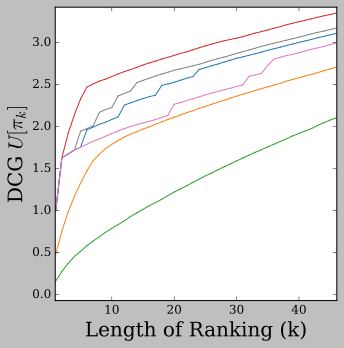

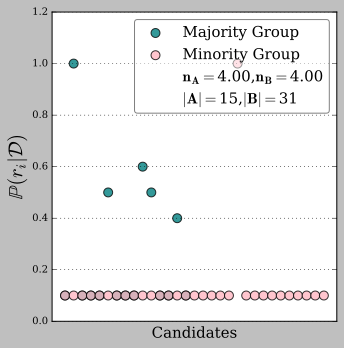

In [11]:
A_true = [1, 0.6, 0.5, 0.5, 0.4, 0.1, 0.1, 0.1,0.1,0.1, 0.1,0.1,0.1,0.1,0.1]
B_true = [1]+[0.1]*30
np.random.shuffle(A_true)
np.random.shuffle(B_true)
# A_true=[1,0.7,0.55,0.5,0.5,0.5,0.5,0.5]
# B_true=[1,0.5,0.1,0.1]
A_dist = [Bernoulli(p) for p in A_true]
B_dist = [Bernoulli(p) for p in B_true]
exp = simpleOffline(num_groups=2, start_minority_idx=len(A_true), num_docs=len(A_true)+len(B_true), 
    predfined_ls=[A_dist, B_dist], distType=BetaBernoulli,
                    offset=0.07, switch_start=False)
exp.experiment(rankingAlgos=[PRP_Ranker, EO_RankerII, TS_RankerII, DP_Ranker, Uniform_Ranker, DP_RankerII], simulations=1000)
plot_relevance_probs(A_true, B_true, loc='upper right', extra=True)

100%|██████████████████████████████████████████████████████████| 1000/1000 [00:00<00:00, 69748.13it/s]


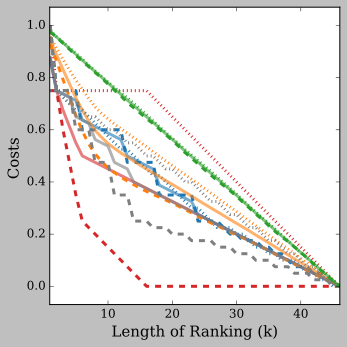

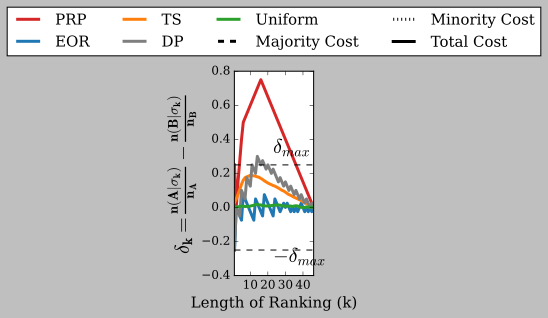

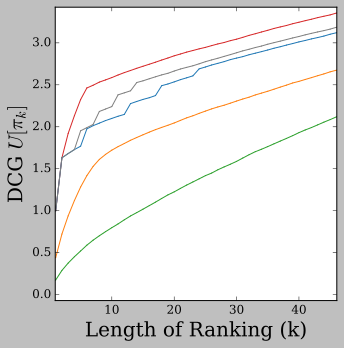

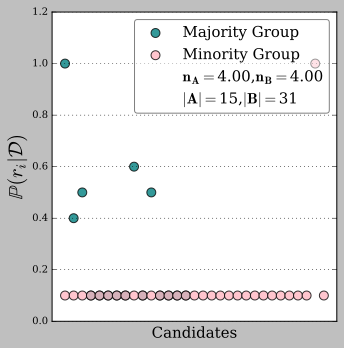

In [9]:
A_true = [1, 0.6, 0.5, 0.5, 0.4, 0.1, 0.1, 0.1,0.1,0.1, 0.1,0.1,0.1,0.1,0.1]
B_true = [1]+[0.1]*30
np.random.shuffle(A_true)
np.random.shuffle(B_true)
# A_true=[1,0.7,0.55,0.5,0.5,0.5,0.5,0.5]
# B_true=[1,0.5,0.1,0.1]
A_dist = [Bernoulli(p) for p in A_true]
B_dist = [Bernoulli(p) for p in B_true]
exp = simpleOffline(num_groups=2, start_minority_idx=len(A_true), num_docs=len(A_true)+len(B_true), 
    predfined_ls=[A_dist, B_dist], distType=BetaBernoulli, saveFig=osp.join(save_path, 'handpicked'),
                    offset=0.07, switch_start=False)
exp.experiment(rankingAlgos=[PRP_Ranker, EO_RankerII, TS_RankerII, DP_Ranker, Uniform_Ranker], simulations=1000)
plot_relevance_probs(A_true, B_true, loc='upper right', extra=True, savefig='handpicked_rel.pdf')

In [16]:
A_true

[0.1, 0.1, 0.5, 0.1, 0.6, 0.1, 0.1, 0.1, 0.5, 0.1, 0.1, 1, 0.1, 0.4, 0.1]

100%|████████████████████████████████████████████| 1000/1000 [00:00<00:00, 87780.00it/s]


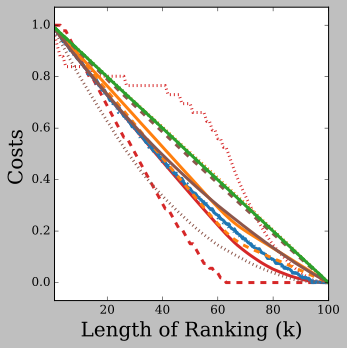

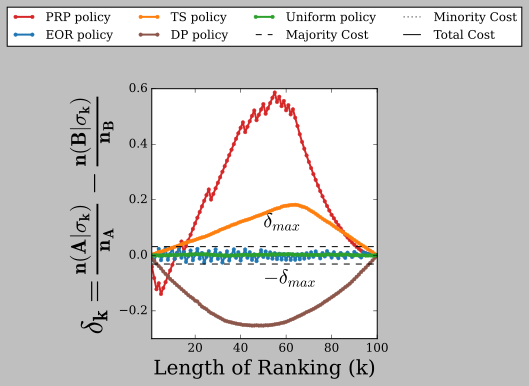

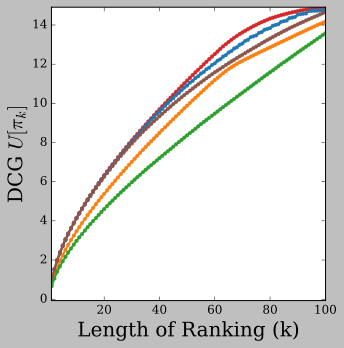

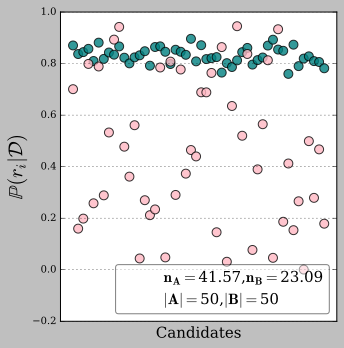

In [40]:
A_true = np.random.beta(a=100,b=20, size=50)
B_true = np.random.beta(a=1, b=1, size=50)
A_dist = [Bernoulli(p) for p in A_true]
B_dist = [Bernoulli(p) for p in B_true]
exp = simpleOffline(num_groups=2, start_minority_idx=len(A_true), num_docs=len(A_true)+len(B_true), 
                    predfined_ls=[A_dist, B_dist], distType=BetaBernoulli, saveFig=osp.join(save_path, 'beta'),
                    offset=0.07, switch_start=True)
exp.experiment(rankingAlgos=[PRP_Ranker, EO_RankerII, TS_RankerII, DP_Ranker, Uniform_Ranker], simulations=1000)
plot_relevance_probs(A_true, B_true, savefig='beta_rel.pdf')

100%|████████████████████████████████████████████| 1000/1000 [00:00<00:00, 78623.05it/s]


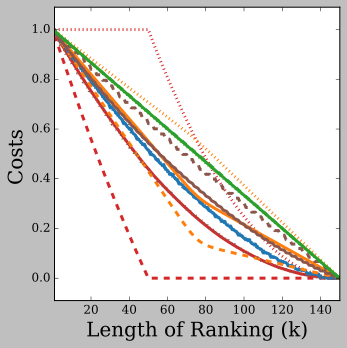

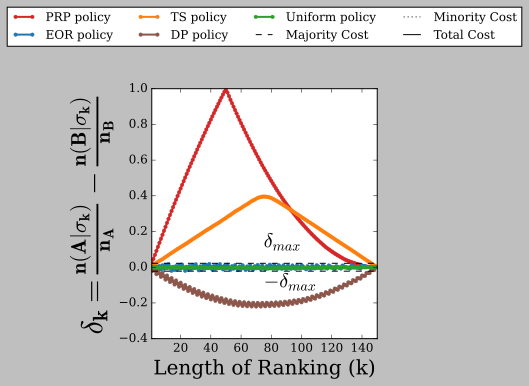

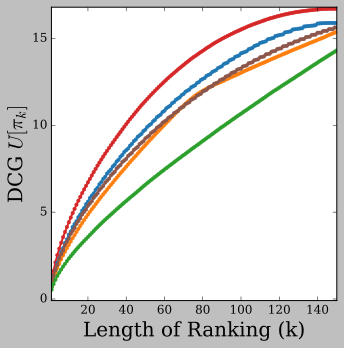

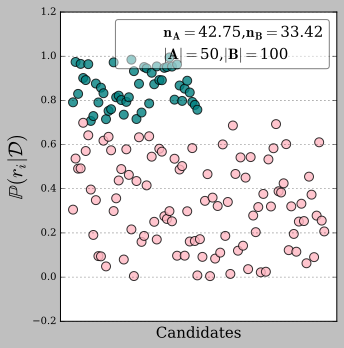

In [35]:
A_true = np.random.uniform(0.7,1, size=50)
B_true = np.random.uniform(0,0.7, size=100)
np.random.shuffle(A_dist)
np.random.shuffle(B_dist)
# A_true = np.random.beta(a=100,b=20, size=50)
# B_true = np.random.beta(a=1, b=1, size=50)

A_dist = [Bernoulli(p) for p in A_true]
B_dist = [Bernoulli(p) for p in B_true]
exp = simpleOffline(num_groups=2, start_minority_idx=len(A_true), num_docs=len(A_true)+len(B_true), 
                    predfined_ls=[A_dist, B_dist], distType=BetaBernoulli, saveFig=osp.join(save_path, 'uniform'),
                    offset=0.09, switch_start=False)
exp.experiment(rankingAlgos=[PRP_Ranker, EO_RankerII, TS_RankerII, DP_Ranker, Uniform_Ranker], simulations=1000)
plot_relevance_probs(A_true, B_true, loc='upper right', savefig='biased_uniform_rel.pdf')

100%|████████████████████████████████████████████| 1000/1000 [00:00<00:00, 90016.18it/s]


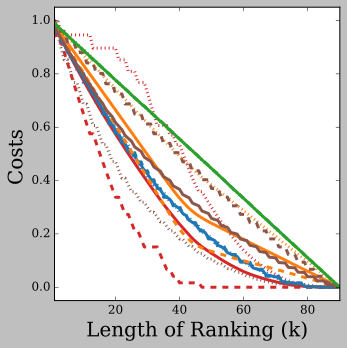

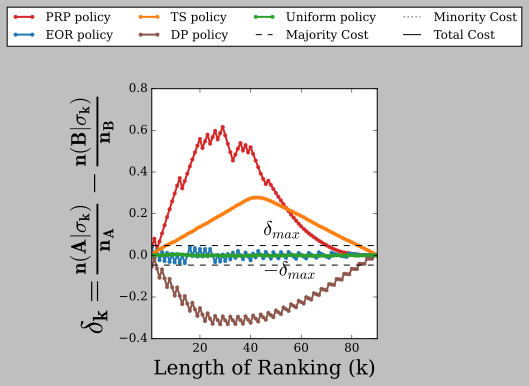

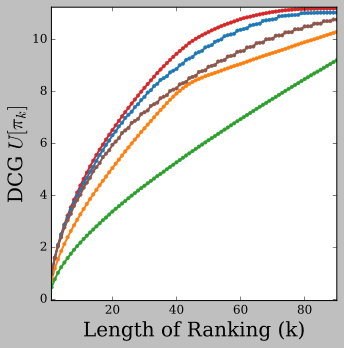

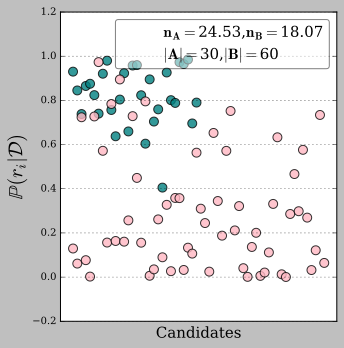

In [36]:
A_true = np.random.power(5,size=30)
B_true = np.random.power(0.5,size=60)

A_dist = [Bernoulli(p) for p in A_true]
B_dist = [Bernoulli(p) for p in B_true]
exp = simpleOffline(num_groups=2, start_minority_idx=len(A_true), num_docs=len(A_true)+len(B_true), 
      predfined_ls=[A_dist, B_dist], distType=BetaBernoulli, saveFig=osp.join(save_path, 'powerlaw'),
                    offset=0.05, switch_start=False)
exp.experiment(rankingAlgos=[PRP_Ranker, EO_RankerII, TS_RankerII, DP_Ranker, Uniform_Ranker], simulations=1000)
plot_relevance_probs(A_true, B_true, loc='upper right', savefig='powerlaw_rel.pdf')


100%|██████████████████████████████████████████████████████████| 1000/1000 [00:00<00:00, 92166.30it/s]


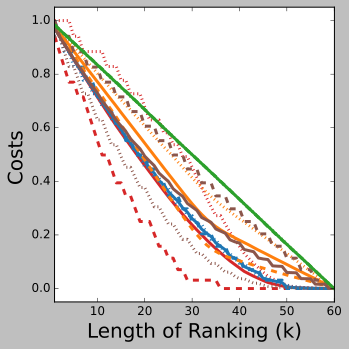

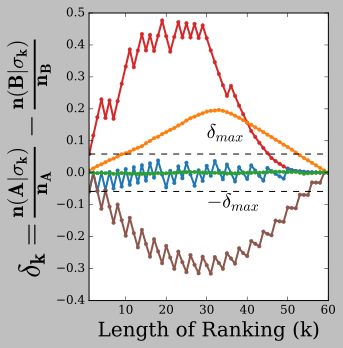

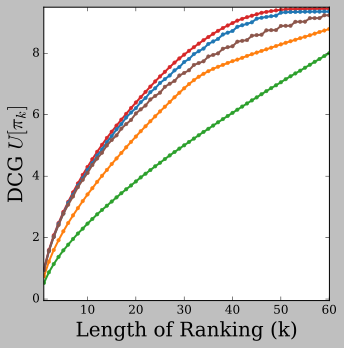

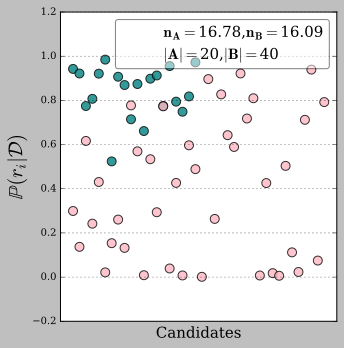

In [43]:
# A_true = np.random.power(5,size=50)
# n_A=sum(A_true)
# B_true=[]
# n_B=0
# while abs(n_A-n_B)>=rel_diff:
#     B_true.append(np.random.power(0.5,size=1).item())
#     n_B=sum(B_true)


# A_dist = [Bernoulli(p) for p in A_true]
# B_dist = [Bernoulli(p) for p in B_true]
# exp = simpleOffline(num_groups=2, start_minority_idx=len(A_true), num_docs=len(A_true)+len(B_true), 
#       predfined_ls=[A_dist, B_dist], distType=BetaBernoulli, saveFig=osp.join(save_path, 'powerlaw_auto'),
#                     offset=0.05, switch_start=False)
# exp.experiment(rankingAlgos=[PRP_Ranker, EO_RankerII, TS_RankerII, DP_Ranker, Uniform_Ranker], simulations=1000)
# plot_relevance_probs(A_true, B_true, loc='upper right', savefig='powerlaw_rel_auto.pdf')


100%|██████████████████████████████████████████████████████| 1000/1000 [00:00<00:00, 74743.46it/s]


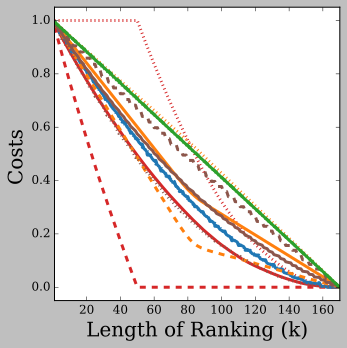

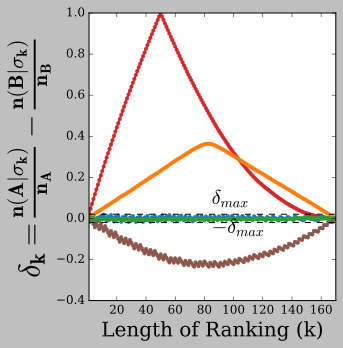

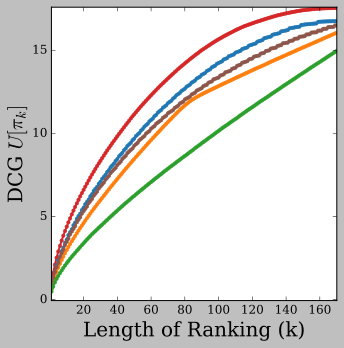

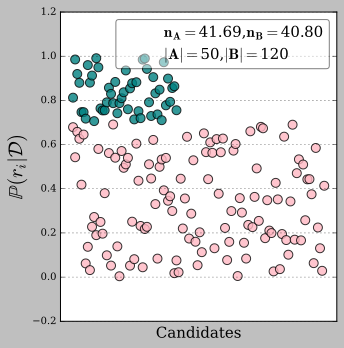

In [35]:
# A_true = np.random.uniform(0.7,1, size=50)
# n_A=sum(A_true)
# B_true=[]
# n_B=0
# while abs(n_A-n_B)>=rel_diff:
#     B_true.append(np.random.uniform(0,0.7, size=1).item())
#     n_B=sum(B_true)


# A_dist = [Bernoulli(p) for p in A_true]
# B_dist = [Bernoulli(p) for p in B_true]
# exp = simpleOffline(num_groups=2, start_minority_idx=len(A_true), num_docs=len(A_true)+len(B_true), 
#       predfined_ls=[A_dist, B_dist], distType=BetaBernoulli, saveFig=osp.join(save_path, 'uniform_auto'),
#                     offset=0.05, switch_start=False)
# exp.experiment(rankingAlgos=[PRP_Ranker, EO_RankerII, TS_RankerII, DP_Ranker, Uniform_Ranker], simulations=1000)
# plot_relevance_probs(A_true, B_true, loc='upper right', savefig='uniform_rel_auto.pdf')

100%|██████████████████████████████████████████████████████| 1000/1000 [00:00<00:00, 78518.55it/s]


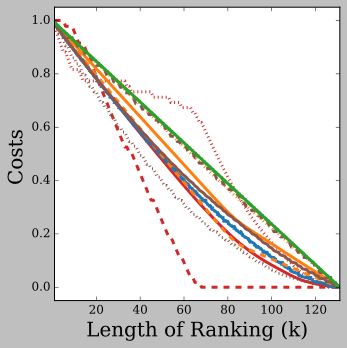

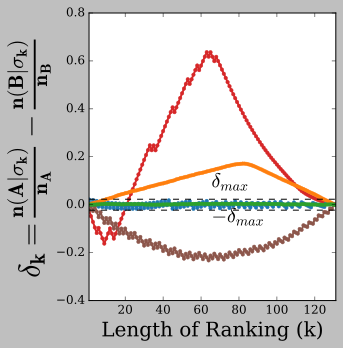

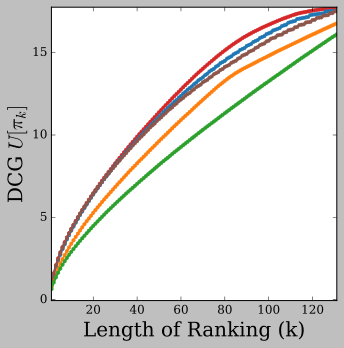

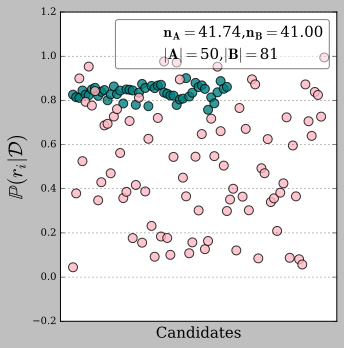

In [36]:
# A_true = np.random.beta(a=100,b=20, size=50)
# n_A=sum(A_true)
# B_true=[]
# n_B=0
# while abs(n_A-n_B)>=rel_diff:
#     B_true.append(np.random.beta(a=1,b=1, size=1).item())
#     n_B=sum(B_true)


# A_dist = [Bernoulli(p) for p in A_true]
# B_dist = [Bernoulli(p) for p in B_true]
# exp = simpleOffline(num_groups=2, start_minority_idx=len(A_true), num_docs=len(A_true)+len(B_true), 
#       predfined_ls=[A_dist, B_dist], distType=BetaBernoulli, saveFig=osp.join(save_path, 'beta_auto'),
#                     offset=0.05, switch_start=False)
# exp.experiment(rankingAlgos=[PRP_Ranker, EO_RankerII, TS_RankerII, DP_Ranker, Uniform_Ranker], simulations=1000)
# plot_relevance_probs(A_true, B_true, loc='upper right', savefig='beta_rel_auto.pdf')

In [29]:
n_A, n_B

(24.104403077401095, array([22.51025928]))

100%|██████████████████████████████████████████████████████████| 1000/1000 [00:00<00:00, 65005.80it/s]


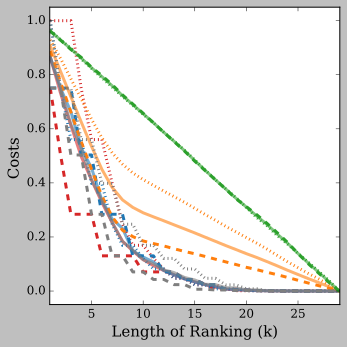

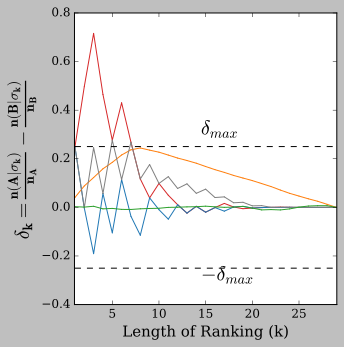

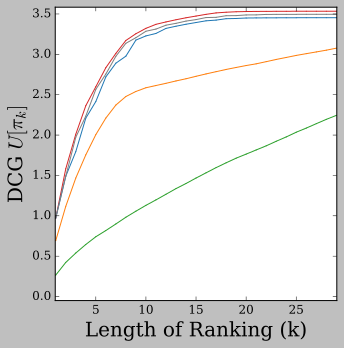

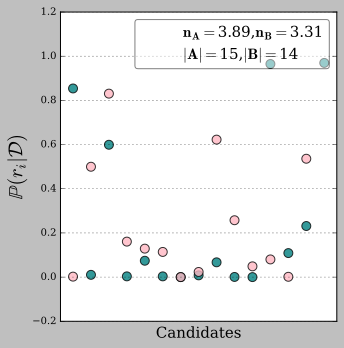

In [69]:
#same relevance
# size_A = np.random.choice(np.arange(30,100), 1)
A_true = np.random.power(0.3,size=15)
n_A=sum(A_true)
B_true=[]
n_B=0
while abs(n_A-n_B)>=rel_diff:
    B_true.append(np.random.power(0.1,size=1).item())
    n_B=sum(B_true)


A_dist = [Bernoulli(p) for p in A_true]
B_dist = [Bernoulli(p) for p in B_true]
exp = simpleOffline(num_groups=2, start_minority_idx=len(A_true), num_docs=len(A_true)+len(B_true), 
      predfined_ls=[A_dist, B_dist], distType=BetaBernoulli,
                    offset=0.05, switch_start=False)
exp.experiment(rankingAlgos=[PRP_Ranker, EO_RankerII, TS_RankerII, DP_Ranker, Uniform_Ranker], simulations=1000)
plot_relevance_probs(A_true, B_true, loc='upper right')


100%|██████████████████████████████████████████████████████████| 1000/1000 [00:00<00:00, 69011.37it/s]


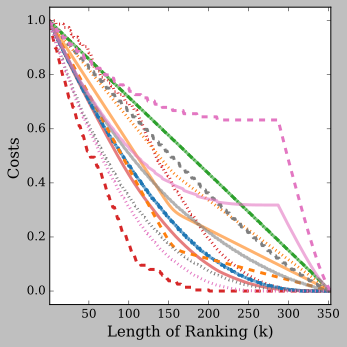

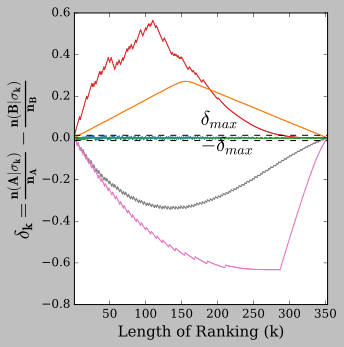

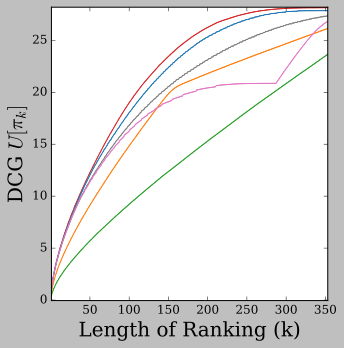

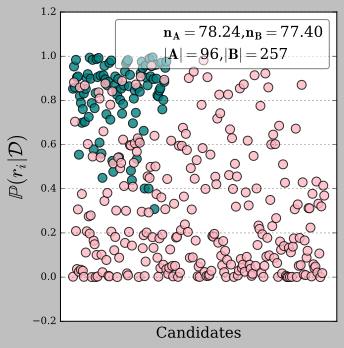

In [13]:
#same relevance
size_A = np.random.choice(np.arange(30,100), 1)
A_true = np.random.power(5,size=size_A)
n_A=sum(A_true)
B_true=[]
n_B=0
while abs(n_A-n_B)>=rel_diff:
    B_true.append(np.random.power(0.5,size=1).item())
    n_B=sum(B_true)


A_dist = [Bernoulli(p) for p in A_true]
B_dist = [Bernoulli(p) for p in B_true]
exp = simpleOffline(num_groups=2, start_minority_idx=len(A_true), num_docs=len(A_true)+len(B_true), 
      predfined_ls=[A_dist, B_dist], distType=BetaBernoulli, saveFig=osp.join(save_path, 'powerlaw_same_rel'),
                    offset=0.05, switch_start=False)
exp.experiment(rankingAlgos=[PRP_Ranker, EO_RankerII, TS_RankerII, DP_Ranker, Uniform_Ranker, DP_RankerII], simulations=1000)
plot_relevance_probs(A_true, B_true, loc='upper right', savefig='powerlaw_same_rel.pdf')


100%|██████████████████████████████████████████████████████████| 1000/1000 [00:00<00:00, 77233.21it/s]


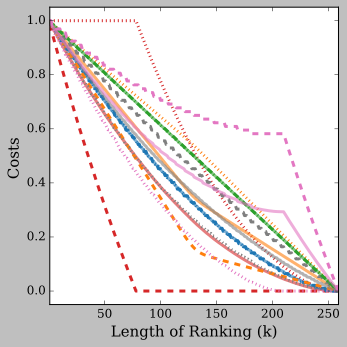

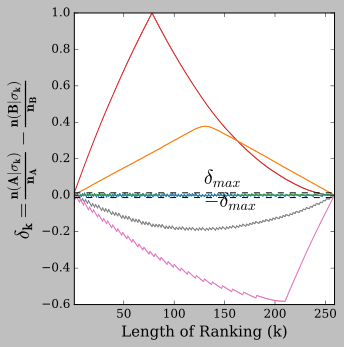

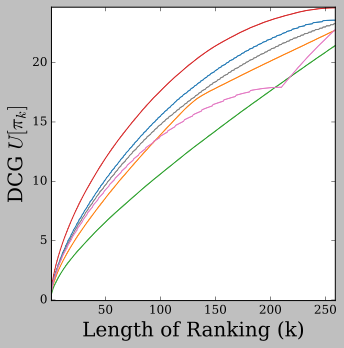

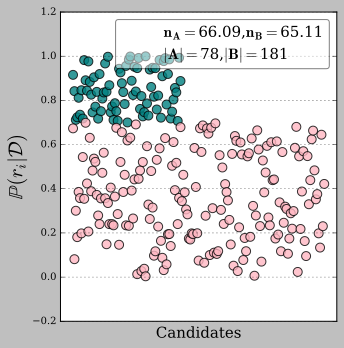

In [15]:
#same relevance
size_A = np.random.choice(np.arange(30,100), 1)
A_true = np.random.uniform(0.7,1, size=size_A)
n_A=sum(A_true)
B_true=[]
n_B=0
while abs(n_A-n_B)>=rel_diff:
    B_true.append(np.random.uniform(0,0.7, size=1).item())
    n_B=sum(B_true)


A_dist = [Bernoulli(p) for p in A_true]
B_dist = [Bernoulli(p) for p in B_true]
exp = simpleOffline(num_groups=2, start_minority_idx=len(A_true), num_docs=len(A_true)+len(B_true), 
      predfined_ls=[A_dist, B_dist], distType=BetaBernoulli, saveFig=osp.join(save_path, 'uniform_same_rel'),
                    offset=0.05, switch_start=False)
exp.experiment(rankingAlgos=[PRP_Ranker, EO_RankerII, TS_RankerII, DP_Ranker, Uniform_Ranker, DP_RankerII], simulations=1000)
plot_relevance_probs(A_true, B_true, loc='upper right', savefig='uniform_same_rel.pdf')

100%|██████████████████████████████████████████████████████████| 1000/1000 [00:00<00:00, 84338.13it/s]


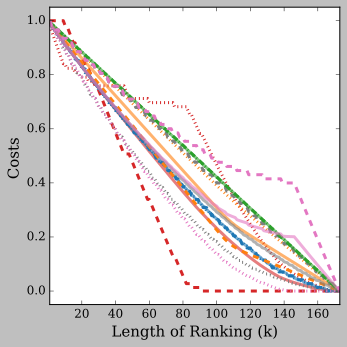

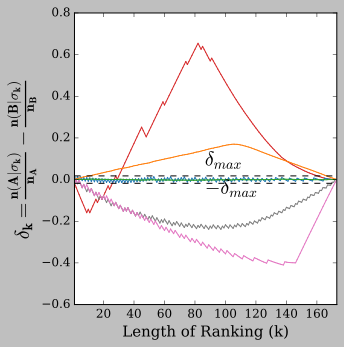

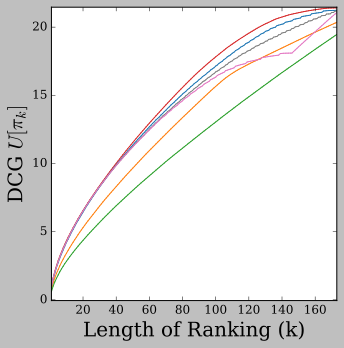

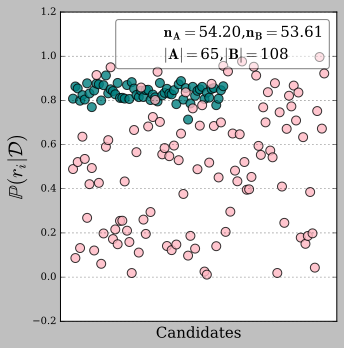

In [16]:
#same relevance
size_A = np.random.choice(np.arange(30,100), 1)
A_true = np.random.beta(a=100,b=20, size=size_A)
n_A=sum(A_true)
B_true=[]
n_B=0
while abs(n_A-n_B)>=rel_diff:
    B_true.append(np.random.beta(a=1,b=1, size=1).item())
    n_B=sum(B_true)


A_dist = [Bernoulli(p) for p in A_true]
B_dist = [Bernoulli(p) for p in B_true]
exp = simpleOffline(num_groups=2, start_minority_idx=len(A_true), num_docs=len(A_true)+len(B_true), 
      predfined_ls=[A_dist, B_dist], distType=BetaBernoulli, saveFig=osp.join(save_path, 'beta_same_rel'),
                    offset=0.05, switch_start=False)
exp.experiment(rankingAlgos=[PRP_Ranker, EO_RankerII, TS_RankerII, DP_Ranker, Uniform_Ranker, DP_RankerII], simulations=1000)
plot_relevance_probs(A_true, B_true, loc='upper right', savefig='beta_same_rel.pdf')

100%|██████████████████████████████████████████████████████████| 1000/1000 [00:00<00:00, 55976.30it/s]


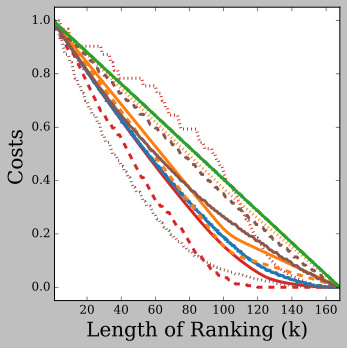

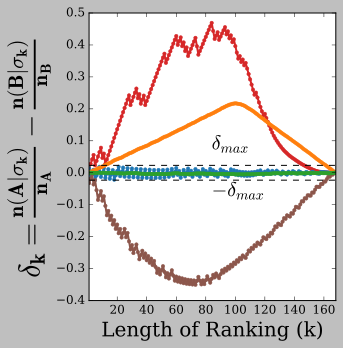

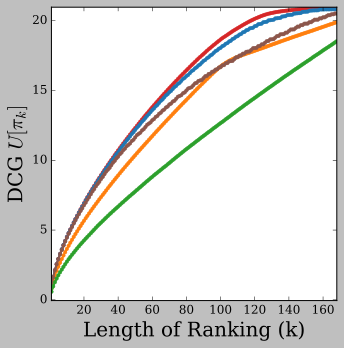

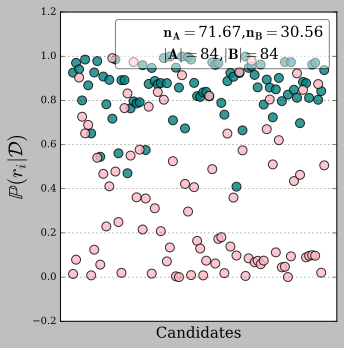

In [46]:
# same size
size_A = np.random.choice(np.arange(50,100), 1)
A_true = np.random.power(5,size=size_A)
size_A=len(A_true)
B_true=[]
size_B=0
while abs(size_A-size_B)>=rel_diff:
    B_true.append(np.random.power(0.5,size=1).item())
    size_B=len(B_true)


A_dist = [Bernoulli(p) for p in A_true]
B_dist = [Bernoulli(p) for p in B_true]
exp = simpleOffline(num_groups=2, start_minority_idx=len(A_true), num_docs=len(A_true)+len(B_true), 
      predfined_ls=[A_dist, B_dist], distType=BetaBernoulli, saveFig=osp.join(save_path, 'powerlaw_same_size'),
                    offset=0.05, switch_start=False)
exp.experiment(rankingAlgos=[PRP_Ranker, EO_RankerII, TS_RankerII, DP_Ranker, Uniform_Ranker], simulations=1000)
plot_relevance_probs(A_true, B_true, loc='upper right', savefig='powerlaw_rel_same_size.pdf')

In [ ]:
# group B is twice the size of group A
size_A = np.random.choice(np.arange(50,100), 1)
A_true = np.random.power(5,size=size_A)
size_A=len(A_true)
B_true=[]
size_B=0
while abs(size_A-(size_B/2))>=rel_diff:
    B_true.append(np.random.power(0.5,size=1).item())
    size_B=len(B_true)


A_dist = [Bernoulli(p) for p in A_true]
B_dist = [Bernoulli(p) for p in B_true]
exp = simpleOffline(num_groups=2, start_minority_idx=len(A_true), num_docs=len(A_true)+len(B_true), 
      predfined_ls=[A_dist, B_dist], distType=BetaBernoulli,
                    offset=0.05, switch_start=False)
exp.experiment(rankingAlgos=[PRP_Ranker, EO_RankerII, TS_RankerII, DP_Ranker, Uniform_Ranker], simulations=1000)
plot_relevance_probs(A_true, B_true, loc='upper right')

In [12]:
# group B is half the size of group A
size_A = np.random.choice(np.arange(50,100), 1)
A_true = np.random.power(5,size=size_A)
size_A=len(A_true)
B_true=[]
size_B=0
while abs(size_A-2*(size_B))>=rel_diff:
    B_true.append(np.random.power(0.5,size=1).item())
    size_B=len(B_true)


A_dist = [Bernoulli(p) for p in A_true]
B_dist = [Bernoulli(p) for p in B_true]
exp = simpleOffline(num_groups=2, start_minority_idx=len(A_true), num_docs=len(A_true)+len(B_true), 
      predfined_ls=[A_dist, B_dist], distType=BetaBernoulli,
                    offset=0.05, switch_start=False)
exp.experiment(rankingAlgos=[PRP_Ranker, EO_RankerII, TS_RankerII, DP_Ranker, Uniform_Ranker], simulations=1000)
plot_relevance_probs(A_true, B_true, loc='upper right')

KeyboardInterrupt: 

100%|██████████████████████████████████████████████████████████| 1000/1000 [00:00<00:00, 87587.53it/s]


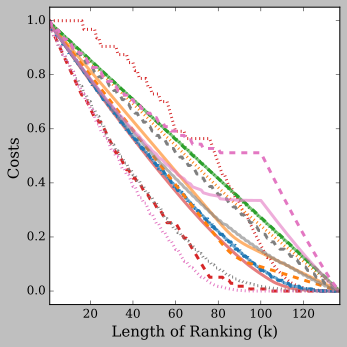

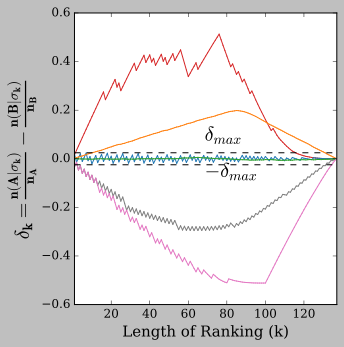

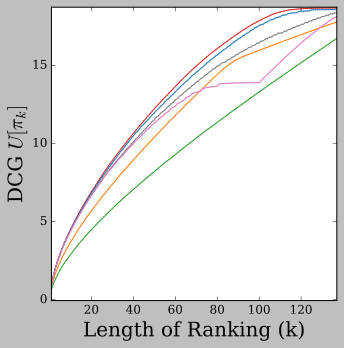

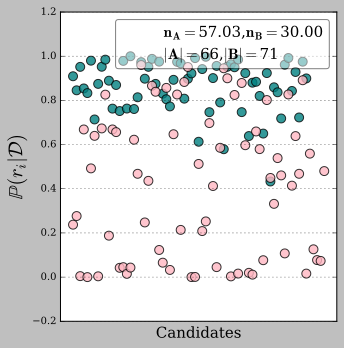

In [17]:
#randomly choose size of A and B
size_A = np.random.choice(np.arange(30,100), 1)
size_B = np.random.choice(np.arange(30,100), 1)
A_true = np.random.power(5,size=size_A)
B_true = np.random.power(0.5,size=size_B)

A_dist = [Bernoulli(p) for p in A_true]
B_dist = [Bernoulli(p) for p in B_true]
exp = simpleOffline(num_groups=2, start_minority_idx=len(A_true), num_docs=len(A_true)+len(B_true), 
      predfined_ls=[A_dist, B_dist], distType=BetaBernoulli, saveFig=osp.join(save_path, 'powerlaw_auto'),
                    offset=0.05, switch_start=False)
exp.experiment(rankingAlgos=[PRP_Ranker, EO_RankerII, TS_RankerII, DP_Ranker, Uniform_Ranker, DP_RankerII], simulations=1000)
plot_relevance_probs(A_true, B_true, loc='upper right', savefig='powerlaw_rel_auto.pdf')

100%|██████████████████████████████████████████████████████████| 1000/1000 [00:00<00:00, 88597.71it/s]


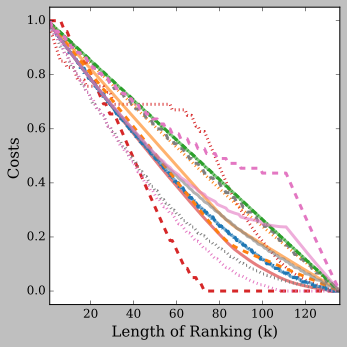

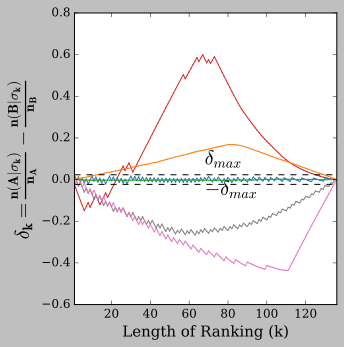

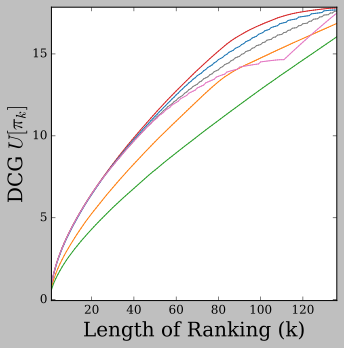

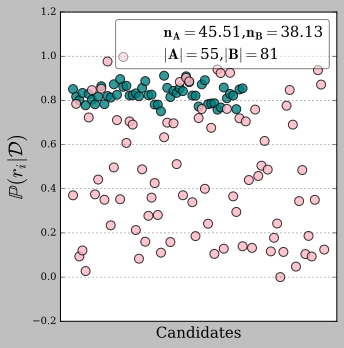

In [18]:
#randomly choose size of A and B
size_A = np.random.choice(np.arange(30,100), 1)
size_B = np.random.choice(np.arange(30,100), 1)
A_true = np.random.beta(a=100,b=20, size=size_A)
B_true = np.random.beta(a=1,b=1, size=size_B)

A_dist = [Bernoulli(p) for p in A_true]
B_dist = [Bernoulli(p) for p in B_true]
exp = simpleOffline(num_groups=2, start_minority_idx=len(A_true), num_docs=len(A_true)+len(B_true), 
      predfined_ls=[A_dist, B_dist], distType=BetaBernoulli, saveFig=osp.join(save_path, 'beta_auto'),
                    offset=0.05, switch_start=False)
exp.experiment(rankingAlgos=[PRP_Ranker, EO_RankerII, TS_RankerII, DP_Ranker, Uniform_Ranker, DP_RankerII], simulations=1000)
plot_relevance_probs(A_true, B_true, loc='upper right', savefig='beta_rel_auto.pdf')

100%|██████████████████████████████████████████████████████████| 1000/1000 [00:00<00:00, 98773.17it/s]


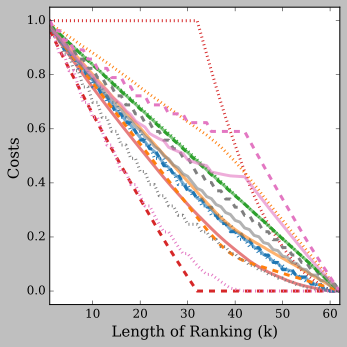

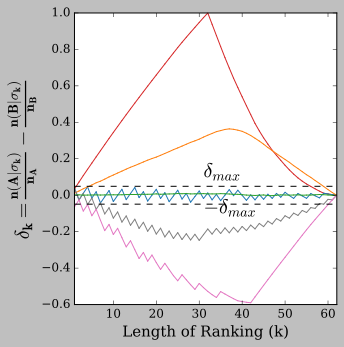

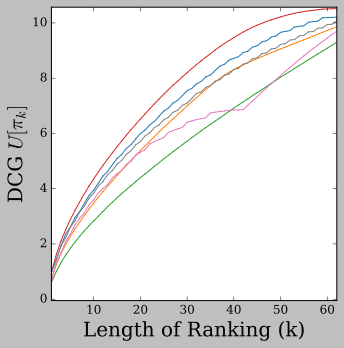

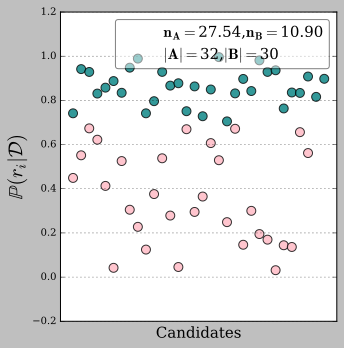

In [19]:
#randomly choose size of A and B
size_A = np.random.choice(np.arange(30,100), 1)
size_B = np.random.choice(np.arange(30,100), 1)
A_true = np.random.uniform(0.7,1, size=size_A)
B_true = np.random.uniform(0,0.7, size=size_B)

A_dist = [Bernoulli(p) for p in A_true]
B_dist = [Bernoulli(p) for p in B_true]
exp = simpleOffline(num_groups=2, start_minority_idx=len(A_true), num_docs=len(A_true)+len(B_true), 
      predfined_ls=[A_dist, B_dist], distType=BetaBernoulli, saveFig=osp.join(save_path, 'uniform_auto'),
                    offset=0.05, switch_start=False)
exp.experiment(rankingAlgos=[PRP_Ranker, EO_RankerII, TS_RankerII, DP_Ranker, Uniform_Ranker, DP_RankerII], simulations=1000)
plot_relevance_probs(A_true, B_true, loc='upper right', savefig='uniform_rel_auto.pdf')

In [ ]:
def plotBetaBernoulli(A_dist=[np.array([1,1,0,0])], A_dist=[np.array([0.5,0.5,0.5,0.5])], size=1000, loc='best'):
    fig,ax = plt.subplots(figsize=(5,5))
    for a_major in alphas_majority:
        dirich_samples=Drichlet(a_major).sample(num_samples=size)
        exp_score = [Multinomial(d).getMean() for d in dirich_samples]
        sns.kdeplot(exp_score, 
                     color = "lightpink",
                     alpha=0.1,
                     fill=True,
                     ax = ax)
        means_majority = Multinomial(Drichlet(a_major).getMean()).getMean()
        ax.vlines(means_majority, 0, 0.5,  linewidth=2.0, zorder=3, color='lightpink')
    
    for a_minor in alphas_minority:
        dirich_samples=Drichlet(a_minor).sample(num_samples=size)
        exp_score = [Multinomial(d).getMean() for d in dirich_samples]
        sns.kdeplot(exp_score, 
                     color = "teal",
                     alpha=0.1,
                     fill=True,
                     ax = ax)
        means_minority = Multinomial(Drichlet(a_minor).getMean()).getMean()
        ax.vlines(means_minority, 0, 0.5,  linewidth=2.0, zorder=3, color='black')

    ax.set_title("Posterior Distribution and expected merit", fontsize=20)
    ax.set_xlabel(r'Expected merit $\mathbb{E}[r_i]$', fontsize=20)
    
    A_dist = [Multinomial(Drichlet(p).getMean()) for p in alphas_majority]
    B_dist = [Multinomial(Drichlet(p).getMean()) for p in alphas_minority]
    n_majority=sum([p.getMean() for p in A_dist])
    n_minority=sum([p.getMean() for p in B_dist])
    ax.plot([], [], ' ', label=f"n_A={n_majority:.3f}, n_B={n_minority:.3f}")
    ax.plot([], [], ' ', label=f"size_A={len(A_dist)}, size_B={len(B_dist)}")
    handles, labels = ax.get_legend_handles_labels()
    vertical_line = lines.Line2D([], [], color='black', marker='|', linestyle='None',
                          markersize=10, markeredgewidth=3.5, label=r'Expected Merits')
    horizontal_line_majority = lines.Line2D([], [], color='lightpink', marker='_', linestyle='None',
                          markersize=10, markeredgewidth=3.5, label=r'majority posterior')
    horizontal_line_minority = lines.Line2D([], [], color='teal', marker='_', linestyle='None',
                          markersize=10, markeredgewidth=3.5, label=r'minority posterior')
    handles.extend([vertical_line, horizontal_line_majority, horizontal_line_minority])
    ax.legend(handles=handles, fontsize=20, loc=loc)
    # ax.set_xlim(1, len(alphas_majority[0])+1)
    ax.set_yticks([])
    ax.set_ylabel(r'Posterior $P(r_i|D)$', fontsize=20)
    plt.show()

Text(0.5, 1.0, 'np.random.power(0.8)')

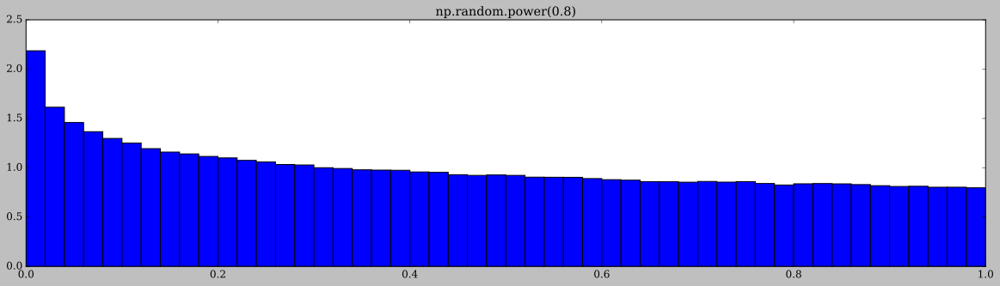

In [49]:
from scipy import stats
power_exp=0.8
rvs = np.random.power(power_exp, 1000000)
# rvsp = np.random.pareto(power_exp, 1000000)
xx = np.linspace(0,1,100)
powpdf = stats.powerlaw.pdf(xx,power_exp)
plt.figure()
plt.hist(rvs, bins=50, density=True)
# plt.plot(xx,powpdf,'r-')  
plt.title(f'np.random.power({power_exp})')

Text(0.5, 1.0, 'np.random.exponential(5)')

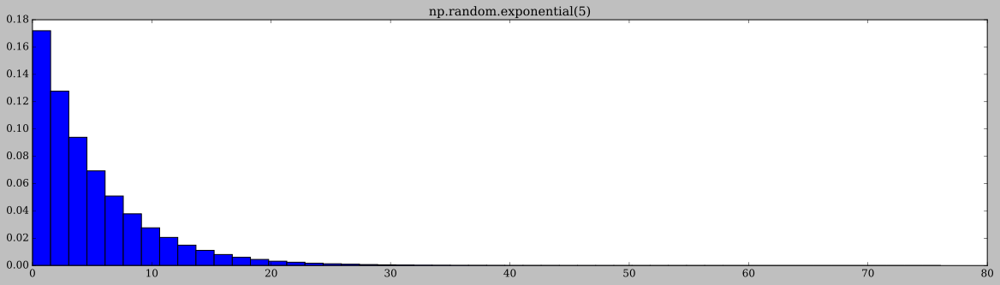

In [44]:
from scipy import stats
exp_const=5
rvs = np.random.exponential(exp_const, 1000000)
xx = np.linspace(0,1,100)
# powpdf = stats.powerlaw.pdf(xx,power_exp)
plt.figure()
plt.hist(rvs, bins=50, density=True)
# plt.plot(xx,powpdf,'r-')  
plt.title(f'np.random.exponential({exp_const})')

In [24]:
rvs

array([0.6359466 , 0.66075521, 0.073389  , ..., 0.06038003, 0.01810673,
       0.1966835 ])

In [8]:
A_true_arr = np.array([[0,0,0,0,100],[0,0,0,0,100],[100,0,0,0,0],[0,0,0,0,60],[0,0,0,0,100]])
print(A_true_arr+1)
B_true_arr = np.array([[1,1,0,0,0],[0,0,1,1,0],[0,0,0,1,1],[1,1,1,1,1],[1,1,1,1,1]])
print(B_true_arr+1)

[[  1   1   1   1 101]
 [  1   1   1   1 101]
 [101   1   1   1   1]
 [  1   1   1   1  61]
 [  1   1   1   1 101]]
[[2 2 1 1 1]
 [1 1 2 2 1]
 [1 1 1 2 2]
 [2 2 2 2 2]
 [2 2 2 2 2]]


In [9]:
# A_true_arr = np.zeros((5, 5), int)
# np.fill_diagonal(A_true_arr, 1)
# B_true_arr = np.zeros((5, 5), int)
# np.fill_diagonal(B_true_arr, 2)
A_true = [A_true_arr[i,:] for i in range(A_true_arr.shape[0])]
B_true = [B_true_arr[i,:] for i in range(B_true_arr.shape[0])]
A_dist = [Multinomial(Drichlet(p).getMean()) for p in A_true]
B_dist = [Multinomial(Drichlet(p).getMean()) for p in B_true]
print(f"n_A:{sum([p.getMean() for p in A_dist])}, num A:{len(A_true)}, n_B:{sum([p.getMean() for p in B_dist])}, num B:{len(B_true)}")

n_A:20.655677655677657, num A:5, n_B:15.142857142857142, num B:5


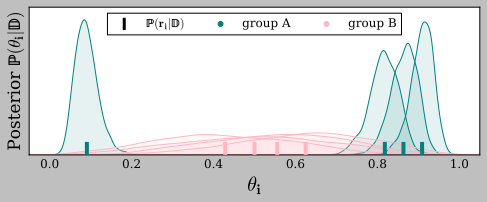

In [14]:
plotBetaDist()

In [11]:
exp = simpleOffline(num_groups=2, start_minority_idx=len(A_true), num_docs=len(A_true)+len(B_true), 
                    predfined_ls=[A_dist, B_dist], distType=DrichletMultinomial)

100%|████████████████████████████████████████████████████████| 500/500 [00:00<00:00, 92467.02it/s]


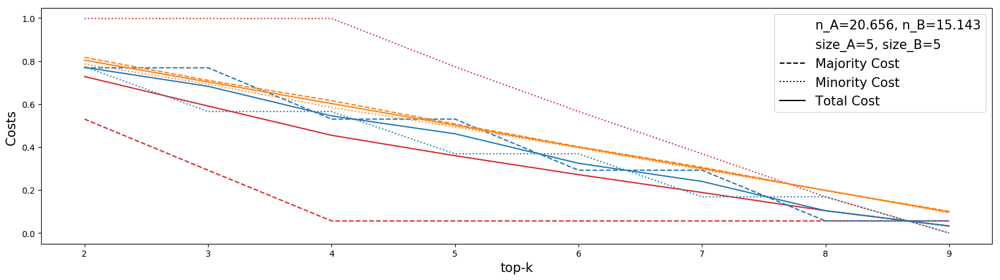

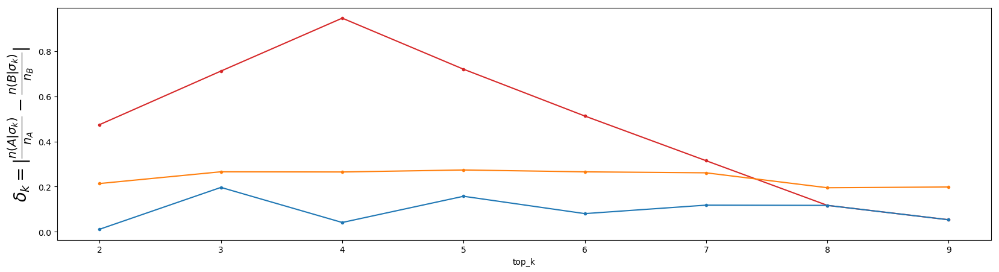

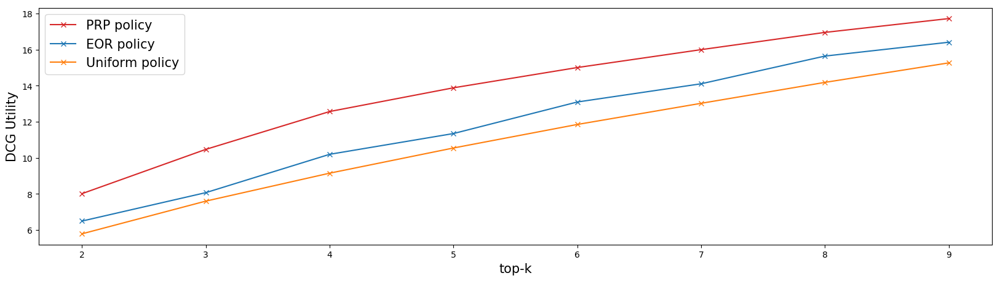

In [12]:
exp.experiment(rankingAlgos=[PRP_Ranker, EO_RankerII, Uniform_Ranker], simulations=500)